In [2]:
# Let's load some other packages we need
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import itertools
import time
%matplotlib inline
import nibabel as nib # common way of importing nibabel


# Introduction

This Jupyter Notebook explores the analysis of resting-state fMRI data to predict gender using machine learning techniques. The workflow includes data preprocessing, feature extraction, functional connectivity analysis, and the application of various machine learning models. Each step is documented to provide a clear understanding of the methodology and results.


# Data processing 

The dataset originally consists of resting-state fMRI data from 6 participants:

* 2 Male
* 4 Female

To address the gender imbalance, data augmentation was performed by including two additional sessions for each of the two male participants. These sessions are from the same individuals and serve to balance the gender representation in the dataset.

After augmentation, the final dataset includes:

* 4 Male (2 participants × 2 sessions each)
* 4 Female (4 participants × 1 session each)
All data are in the resting-state fMRI modality and sourced from the [NSD](https://naturalscenesdataset.org/)

In [8]:
gender = pd.DataFrame({'subject': [1, 2,3,4,5,6,7,8], 'gender': ['M','M','F','F','F','F','M','M']})
#define conditions
conditions = [
    (gender['gender'] == 'M') ,
    (gender['gender'] == 'F') 
   
]

#define results
results = [1, 0]

#create new column based on conditions in column1 and column2
gender['YN'] = np.select(conditions, results)
gender

,subject,gender,YN
0,1,M,1
1,2,M,1
2,3,F,0
3,4,F,0
4,5,F,0
5,6,F,0
6,7,M,1
7,8,M,1


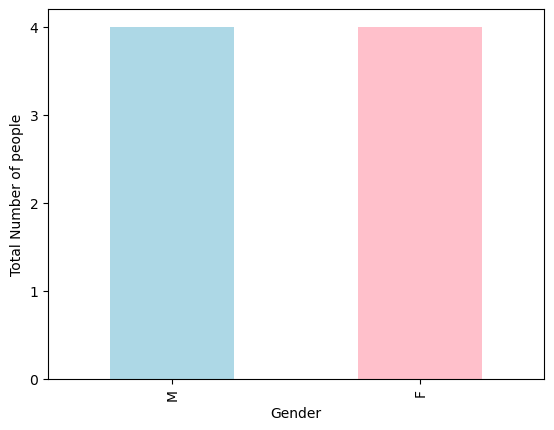

In [21]:
import matplotlib.ticker as ticker
# Modify the bar plot to include whole number ticks
ax = gender.gender.value_counts().plot(kind='bar', color=['lightblue', 'pink'])
ax.set_ylabel('Total Number of people')
ax.set_xlabel('Gender')

# Ensure y-axis ticks are whole numbers
ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.show()

In [ ]:
# gets the file directory of the image
def get_img(file_dir):
    img = nib.load(file_dir)
    return img
    

# storing the file directories in an array of the participates
file =['/kaggle/input/d/genandlam/subj-1betas-session21/betas_session21.nii',
      '/kaggle/input/sub-1-betas-session22/sub_1_betas_session22.nii',
       '/kaggle/input/sub-2-betas-session21/sub_2_betas_session21.nii',
      '/kaggle/input/sub3-betas-session21/sub3_betas_session21.nii',
     '/kaggle/input/sub-4-betas-session21/sub_4_betas_session21.nii',
      '/kaggle/input/sub5-betas-session21/sub5_betas_session21.nii',
      '/kaggle/input/sub-6-betas-session/sub_6_betas_session21.nii',
      '/kaggle/input/sub-6-betas-session/sub_6_betas_session22.nii']

img = get_img(file[0])
img.shape
# This means that there are 125 volumes, each with a 3D structure of (145, 186, 148).


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


(145, 186, 148, 125)

# Functional connection analysis 


codes are taken from [nilearn](https://main-educational.github.io/intro_nilearn/functional-connectivity-with-nilearn.html)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



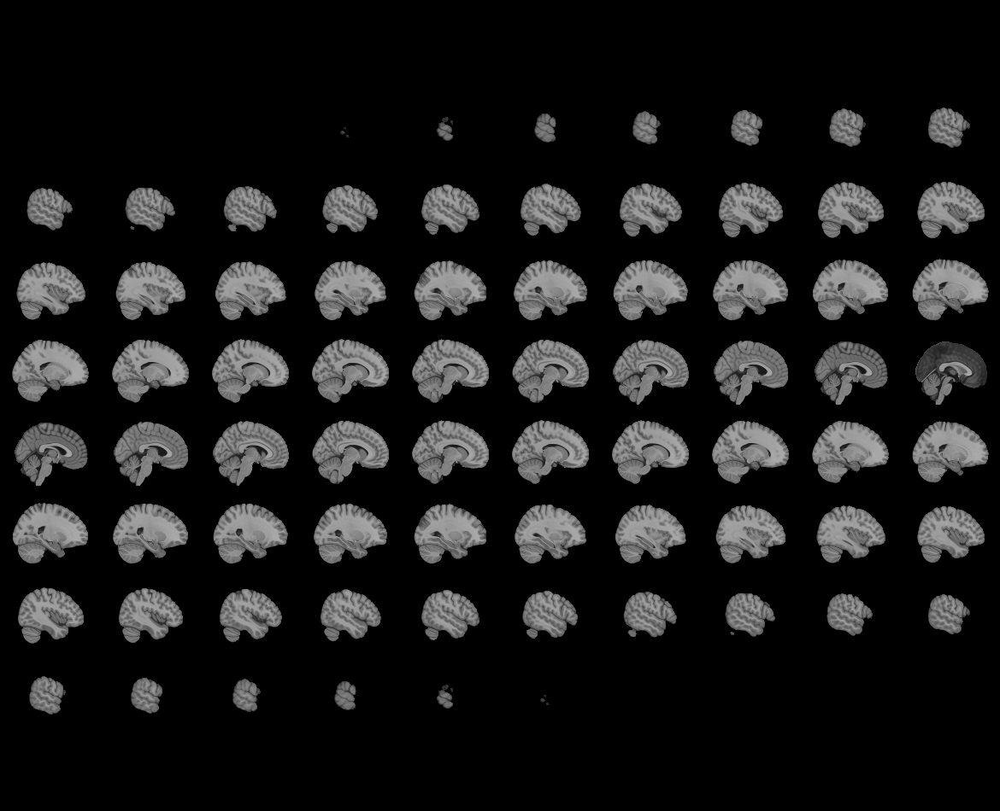
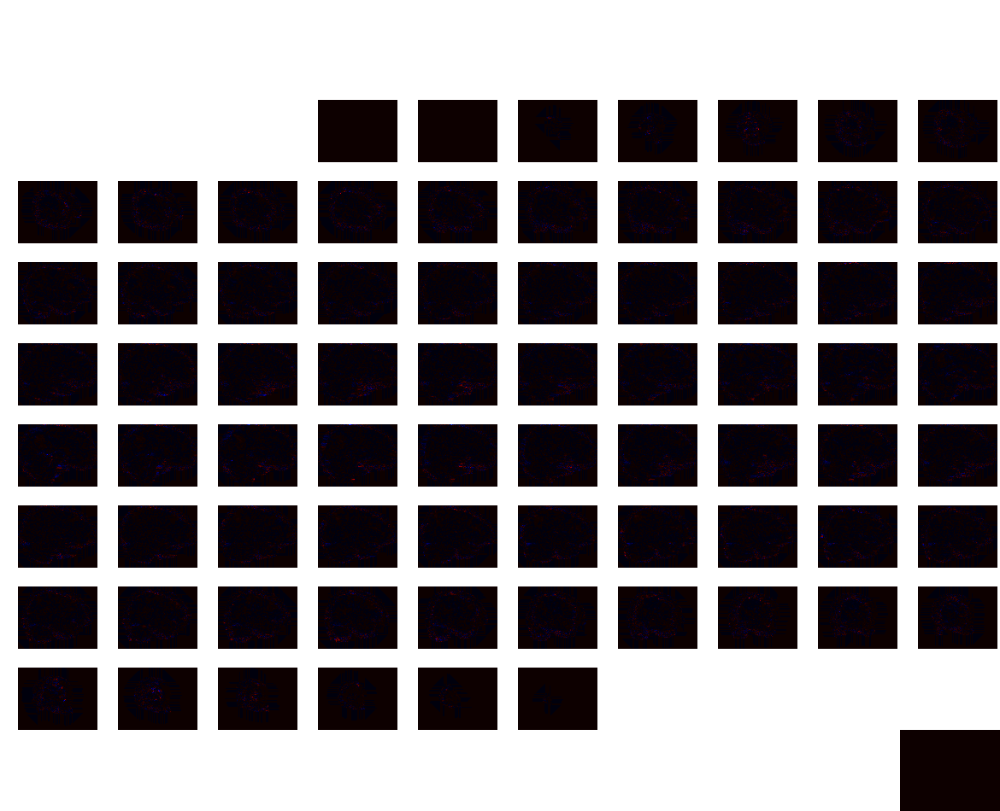

In [4]:
from nilearn import plotting
from nilearn import image
mean_image = image.mean_img(img)
plotting.view_img(mean_image, threshold=None)

Coordinates of the slice we are interested in each direction. We will be using them for visualization.


# Analysing the normalized brain 

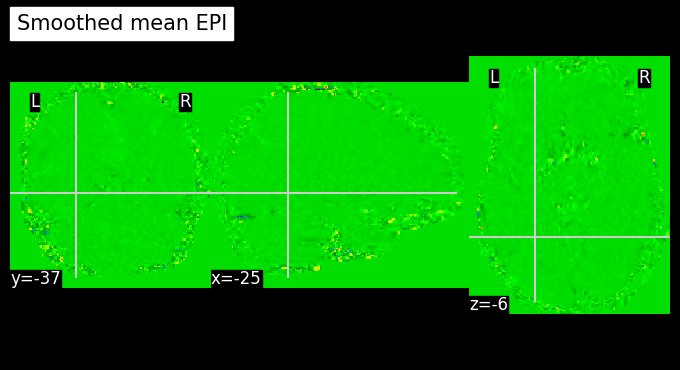

In [ ]:
from nilearn.plotting import plot_epi

# cut in x-direction
sagittal = -25
# cut in y-direction
coronal = -37
# cut in z-direction
axial = -6

# coordinates displaying should be prepared as a list
cut_coords = [sagittal, coronal, axial]
plot_epi(mean_image, title="Smoothed mean EPI", cut_coords=cut_coords)

# Anatomical 

We load the anatomical MRI file of the first subject and visualize its structure using the nibabel library. Below is an example of the anatomical brain structure of the first subject.

In [6]:
# anatomical nifti
anat_mri_file = '/kaggle/input/subj-1-aseg/subj_1_aseg.nii'
anat_img = nib.load(anat_mri_file)
anat_img_data = anat_img.get_fdata()
print(type(anat_img_data))  # it's a numpy array!
print(anat_img_data.shape)

pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


<class 'numpy.memmap'>
(145, 186, 148)


# Extracting signal from fMRI volumes

The data isn't in tabular. We would have to transform and extract them in a structured way. Hence we use masking. 
Essentially, we can imagine overlaying a 3D grid on an image. Then, our mask tells us which cubes or “voxels” (like 3D pixels) to sample from. Since our Nifti images are 4D files, we can’t overlay a single grid – instead, we use a series of 3D grids (one for each volume in the 4D file), so we can get a measurement for each voxel at each timepoint.

Nilearn provides methods to define your own functional parcellation (using clustering algorithms such as k-means), and it also provides access to other atlases that have previously been defined by researchers. In this tutorial we are using a previously atlases defined by researchers. 

Brain atlases are built from one or more representations of brain.

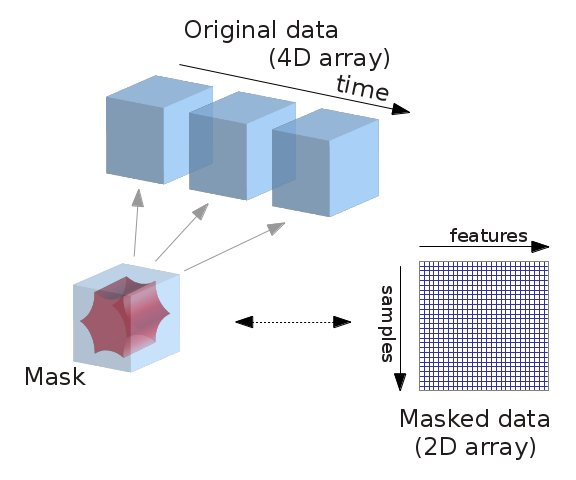

# Choosing regions of interest (ROI)

In this tutorial, we’ll use the MSDL (multi-subject dictionary learning; [VGP+11]) atlas, which defines a set of probabilistic ROIs across the brain.



In [7]:
from nilearn import datasets
msdl_atlas = datasets.fetch_atlas_msdl(data_dir='/kaggle/working')
msdl_coords = msdl_atlas.region_coords
n_regions = len(msdl_coords)

print(f'MSDL has {n_regions} ROIs, part of the following networks :\n{np.unique(msdl_atlas.networks)}.')


Added README.md to /kaggle/working


Dataset created in /kaggle/working/msdl_atlas

MSDL has 39 ROIs, part of the following networks :
['Ant IPS' 'Aud' 'Basal' 'Cereb' 'Cing-Ins' 'D Att' 'DMN' 'Dors PCC'
 'L V Att' 'Language' 'Motor' 'Occ post' 'R V Att' 'Salience' 'Striate'
 'Temporal' 'Vis Sec'].


 ...done. (1 seconds, 0 min)
Extracting data from /kaggle/working/msdl_atlas/8eaecb9e05c478f565847000d9902a25/MSDL_rois.zip..... done.


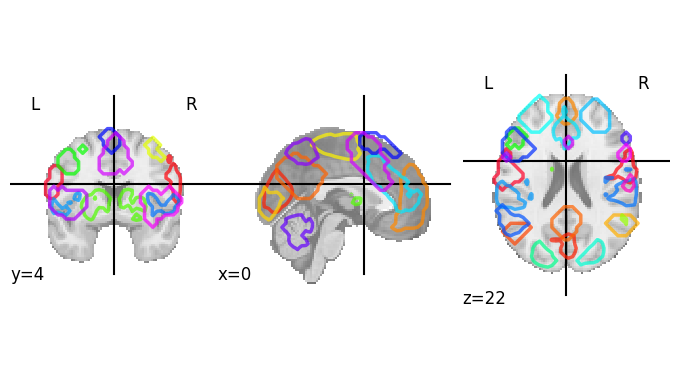

In [8]:
# It also provides us with easy ways to view these atlases directly. Because MSDL is a probabilistic atlas, we can view it using:
plotting.plot_prob_atlas(msdl_atlas.maps)


# Applying a Masker object

We’d like to supply these ROIs to a Masker object. All Masker objects share the same basic structure and functionality, but each is designed to work with a different kind of ROI.

The canonical nilearn.maskers.NiftiMasker works well if we want to apply a single mask to the data, like a single region of interest.

But what if we actually have several ROIs that we’d like to apply to the data all at once? If these ROIs are non-overlapping, as in discrete parcellations, then we can use nilearn.maskers.NiftiLabelsMasker. Because we’re working with probabilistic ROIs, we can instead supply these ROIs to

In [9]:
from nilearn.maskers import NiftiLabelsMasker
from nilearn import maskers

# Instantiate the masker with label image and label values
masker = maskers.NiftiMapsMasker(
    msdl_atlas.maps,resampling_target="data",memory="nilearn_cache_",memory_level=1, detrend=True).fit()
# Visualize the atlas
# Note that we need to call fit prior to generating the mask

# At this point, no functional image has been provided to the masker.
# We can still generate a report which can be displayed in a Jupyter
# Notebook, opened in a browser using the .open_in_browser() method,
# or saved to a file using the .save_as_html(output_filepath) method.
#report = masker.generate_report()
#report

In [10]:
roi_time_series = masker.transform(img)
roi_time_series.shape

(125, 39)

Rather than providing information on every voxel within our original 3D grid, we’re now only considering those voxels that fall in our 39 regions of interest provided by the MSDL atlas and aggregating across voxels within those ROIS. This reduces each 3D volume from a dimensionality of (145, 186, 148) to just 39, for our 39 provided ROIs.

# Connectome

Scientists have found that some cognitive functions involve the activity of neurons from an isolated region, and sometimes different regions of the brain interact together to perform a task. This functional integration leads to a description of the functional brain as a network. Formally, the co-activation of different time series is called functional connectivity.

The simplest and most commonly used kind of functional connectivity is pairwise correlation between ROIs.


In [11]:
from nilearn.connectome import ConnectivityMeasure

correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform([roi_time_series])[0]

In [12]:
correlation_matrix.shape

(39, 39)

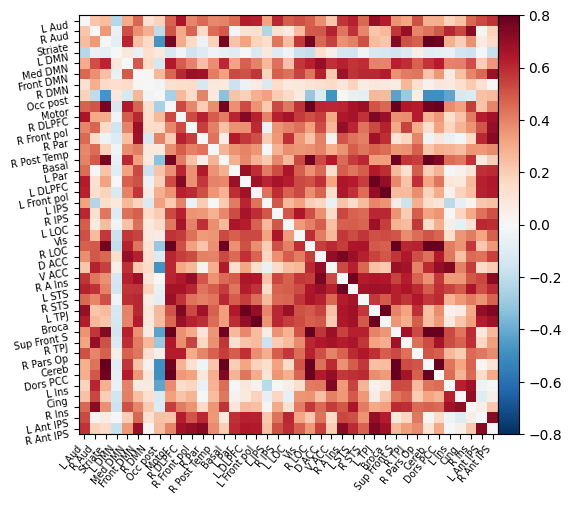

In [13]:
np.fill_diagonal(correlation_matrix, 0)
plotting.plot_matrix(correlation_matrix, labels=msdl_atlas.labels,
                     vmax=0.8, vmin=-0.8, colorbar=True)

In [14]:
plotting.view_connectome(correlation_matrix, edge_threshold=0.2,
                         node_coords=msdl_atlas.region_coords)

# Accounting for noise - Calculating confounds

One important processing step is correcting for measured signals of no interest (e.g., head motion).
In this [Tutorial](https://nilearn.github.io/stable/auto_examples/04_glm_first_level/plot_first_level_details.html#a-first-contrast-estimation-and-plotting) it provided a detailed way to compute confounds. That wasn't provided in the original tutorial. 

In [15]:
from nilearn.image import high_variance_confounds
confonds=high_variance_confounds(img, n_confounds=20, percentile=3.0, detrend=True, mask_img=None)

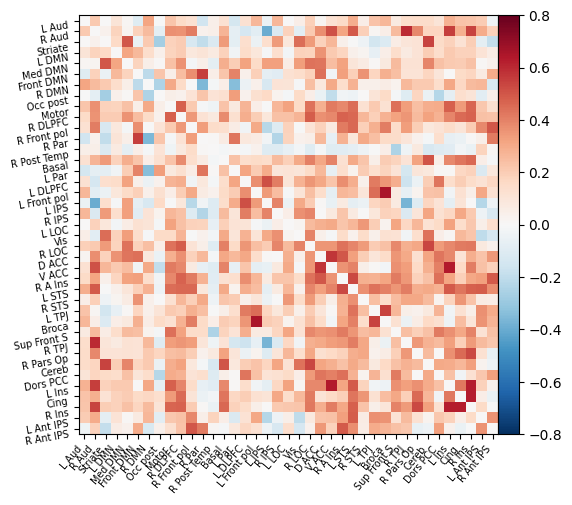

In [16]:
corrected_roi_time_series = masker.transform(
    img, confounds=confonds)
corrected_correlation_matrix = correlation_measure.fit_transform(
    [corrected_roi_time_series])[0]
np.fill_diagonal(corrected_correlation_matrix, 0)
plotting.plot_matrix(corrected_correlation_matrix, labels=msdl_atlas.labels,
                     vmax=0.8, vmin=-0.8, colorbar=True)

In [17]:
plotting.view_connectome(corrected_correlation_matrix, edge_threshold=0.2,
                         node_coords=msdl_atlas.region_coords)

In both the matrix and connectome forms, we can see a big difference when including the confounds! This is an important reminder to make sure that your data are cleaned of any possible sources of noise before running a machine learning analysis. Otherwise, you might be classifying participants on e.g. amount of head motion rather than a feature of interest!

# Predict Gender from resting state fMRI with tradition Machine Learning 

# Extract features with nilearn masker

In [18]:
from nilearn.input_data import NiftiLabelsMasker
from nilearn.connectome import ConnectivityMeasure

data_dir = '/kaggle/working'
# load atlas
multiscale = datasets.fetch_atlas_basc_multiscale_2015(data_dir=data_dir)
atlas_filename = multiscale.scale064

# initialize masker (change verbosity)
masker = NiftiLabelsMasker(labels_img=atlas_filename, standardize=True,
                           memory='nilearn_cache', resampling_target="data",
                           detrend=True, verbose=0)

# initialize correlation measure, set to vectorize
correlation_measure = ConnectivityMeasure(kind='correlation', vectorize=True,
                                         discard_diagonal=True)


Dataset created in /kaggle/working/basc_multiscale_2015



 ...done. (1 seconds, 0 min)
Extracting data from /kaggle/working/basc_multiscale_2015/53337d5c408465aa257d35f81c13413b/1861819..... done.
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


In [19]:
all_features = [] # here is where we will put the data (a container)

for i,sub in enumerate(file):
    # extract the timeseries from the ROIs in the atlas
    img = get_img(sub)
    confonds = high_variance_confounds(img, n_confounds=20, percentile=3.0, detrend=True, mask_img=None)
    time_series = masker.fit_transform(img,confonds )
    # create a region x region correlation matrix
    correlation_matrix = correlation_measure.fit_transform([time_series])[0]
    # add to our container
    all_features.append(correlation_matrix)
    # keep track of status
    print('finished %s of %s'%(i+1,len(file)))

pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 1 of 8


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 2 of 8


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 3 of 8


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 4 of 8


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 5 of 8


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 6 of 8


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 7 of 8


pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


finished 8 of 8


In [20]:
# Let's save the data to disk
import numpy as np

np.savez_compressed('./MAIN_BASC064_subsamp_features', a=all_features)

# Feature Matrix
The feature matrix is constructed by extracting the time series from the regions of interest (ROIs) defined by the atlas for each subject. These time series are then used to compute a correlation matrix, which represents the functional connectivity between the ROIs. The resulting matrices are vectorized and stored as features for machine learning analysis.

In [21]:
feat_file = './MAIN_BASC064_subsamp_features.npz'
X_features = np.load(feat_file)['a']
X_features.shape

(8, 2016)

# Machine Learning
## Using SVC
To predict gender using the resting-state fMRI data, we employ a afew example algorithms such as Support Vector Classifier (SVC) with a linear kernel. The SVC is trained on the feature matrix extracted from the functional connectivity analysis, with gender labels as the target variable.

In [22]:
from sklearn.svm import SVC
l_svc = SVC(kernel='linear', class_weight='balanced') # define the model

l_svc.fit(X_features, gender['gender']) # fit the model

SVC(class_weight='balanced', kernel='linear')

## Computing confusion matrix
To compute the confusion matrix, we use the `confusion_matrix` function from `sklearn.metrics`. This function compares the true labels with the predicted labels to provide a summary of prediction results.

In [23]:
from sklearn.metrics import classification_report, confusion_matrix, precision_score, f1_score

# predict the training data based on the model
y_pred = l_svc.predict(X_features)

# calculate the model accuracy
acc = l_svc.score(X_features,  gender['gender'])

# calculate the model precision, recall and f1, all in one convenient report!
cr = classification_report(y_true= gender['gender'],
                      y_pred = y_pred)

# get a table to help us break down these scores
cm = confusion_matrix(y_true= gender['gender'], y_pred = y_pred)

accuracy: 1.0
              precision    recall  f1-score   support

           F       1.00      1.00      1.00         4
           M       1.00      1.00      1.00         4

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8



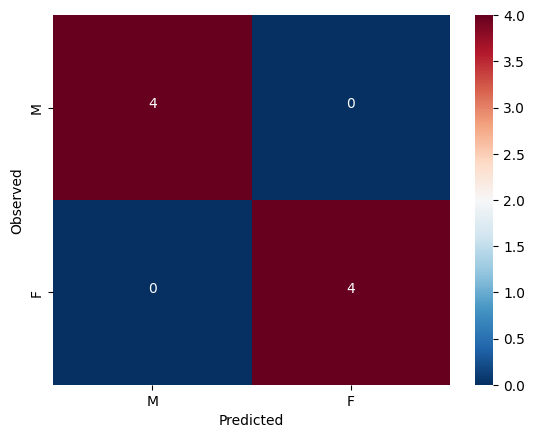

In [24]:
import itertools
from pandas import DataFrame
import seaborn as sns
# print results
print('accuracy:', acc)
print(cr)

# plot confusion matrix
cmdf = DataFrame(cm, index = ['M','F'], columns = ['M','F'])
sns.heatmap(cmdf, cmap = 'RdBu_r')
plt.xlabel('Predicted')
plt.ylabel('Observed')
# label cells in matrix
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j+0.5, i+0.5, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white")

The model generalized very well! We may have found something in this data which does seem to be systematically related to age … but what?

# Interpreting model feature importances

Interpreting the feature importances of a machine learning model is a real can of worms. This is an area of active research. Unfortunately, it’s hard to trust the feature importance of some models.

You can find a whole tutorial on this subject here: http://gael-varoquaux.info/interpreting_ml_tuto/index.html

For now, we’ll just eschew better judgement and take a look at our feature importances.

We can access the feature importances (weights) used by the model

In [25]:
l_svc.coef_

array([[-0.0036911 ,  0.00894018, -0.0045039 , ..., -0.00192278,
         0.00826435,  0.00492486]])

Text(0, 0.5, 'weight')

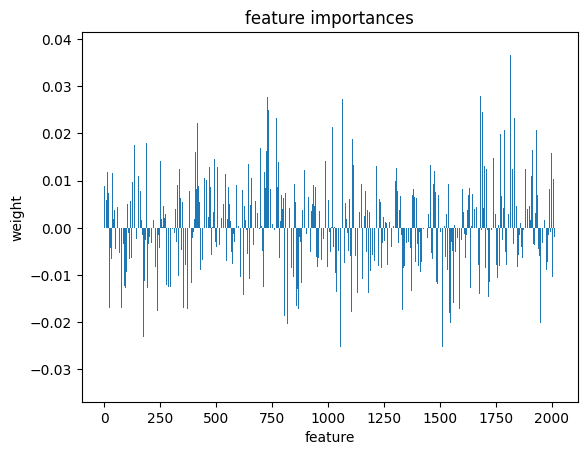

In [26]:
plt.bar(range(l_svc.coef_.shape[-1]),l_svc.coef_[0])
plt.title('feature importances')
plt.xlabel('feature')
plt.ylabel('weight')

In [27]:
correlation_measure.inverse_transform(l_svc.coef_).shape

(1, 64, 64)

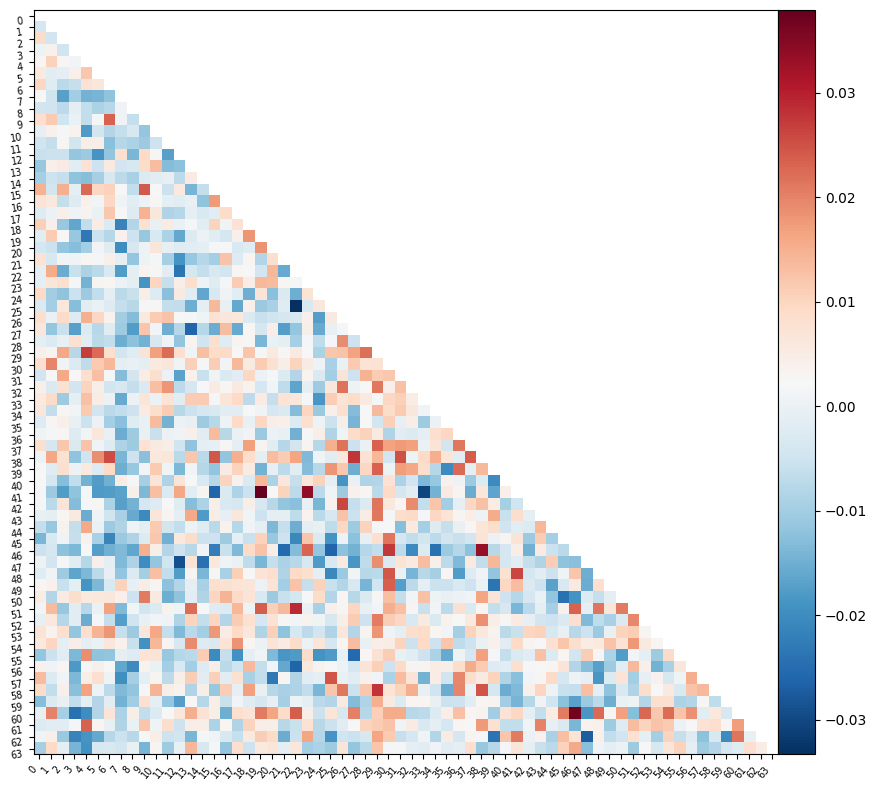

In [28]:
from nilearn import plotting

feat_exp_matrix = correlation_measure.inverse_transform(l_svc.coef_)[0]

plotting.plot_matrix(feat_exp_matrix, figure=(10, 8),  
                     labels=range(feat_exp_matrix.shape[0]),
                     reorder=False,
                    tri='lower')

In [29]:
# the coordinates of each ROI of our atlas
coords = plotting.find_parcellation_cut_coords(atlas_filename)

pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


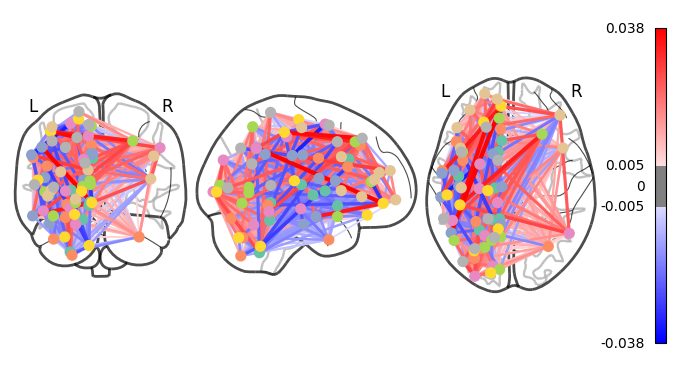

In [30]:
plotting.plot_connectome(feat_exp_matrix, coords, colorbar=True, edge_threshold=0.005)

In [31]:
plotting.view_connectome(feat_exp_matrix, coords, edge_threshold='90%')

# Logistic Regression

Logistic Regression is a linear model for binary classification that predicts the probability of a target variable belonging to a particular class. It is widely used for its simplicity and interpretability. In this section, we apply Logistic Regression to predict gender based on the extracted features from the resting-state fMRI data.

In [ ]:
# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression()

# fit the model with data
logreg.fit(X_features, gender['gender'])

y_pred = logreg.predict(X_features)

In [33]:
# import the metrics class
from sklearn import metrics

# calculate the model accuracy
acc = logreg.score(X_features,  gender['gender'])

# calculate the model precision, recall and f1, all in one convenient report!
cr = classification_report(y_true= gender['gender'],
                      y_pred = y_pred)

# get a table to help us break down these scores
cm = confusion_matrix(y_true= gender['gender'], y_pred = y_pred)

accuracy: 1.0
              precision    recall  f1-score   support

           F       1.00      1.00      1.00         4
           M       1.00      1.00      1.00         4

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8



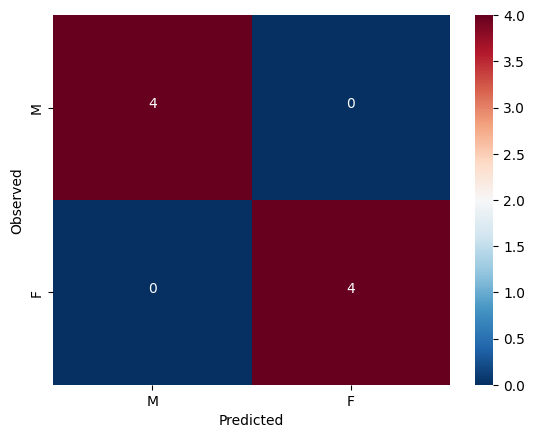

In [34]:
# print results
print('accuracy:', acc)
print(cr)

# plot confusion matrix
cmdf = DataFrame(cm, index = ['M','F'], columns = ['M','F'])
sns.heatmap(cmdf, cmap = 'RdBu_r')
plt.xlabel('Predicted')
plt.ylabel('Observed')
# label cells in matrix
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j+0.5, i+0.5, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white")

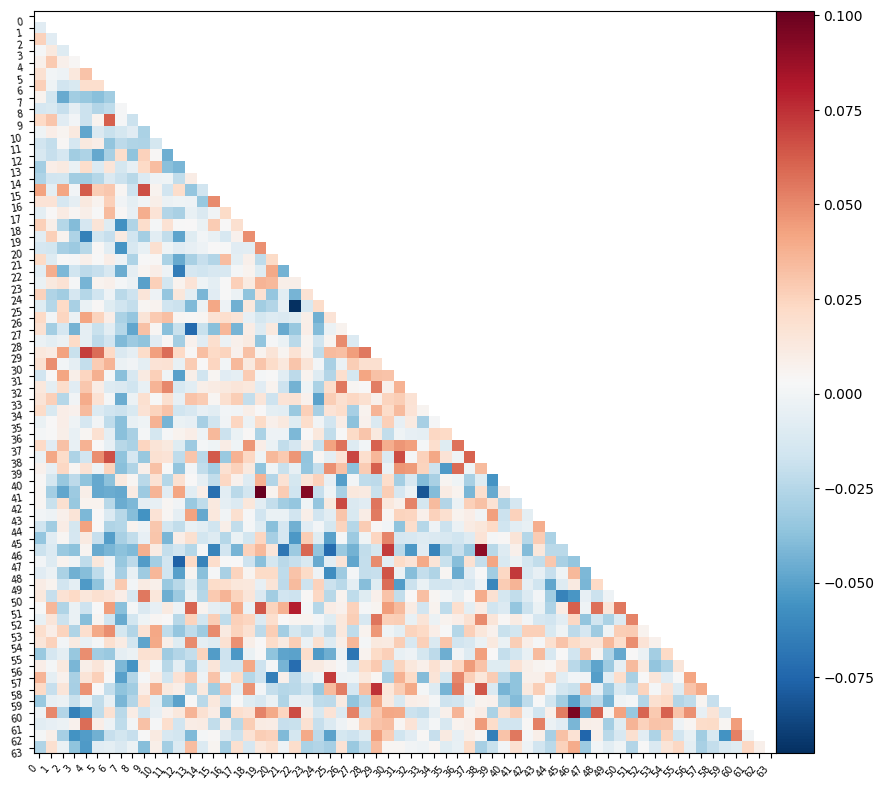

In [35]:
from nilearn import plotting

feat_exp_matrix = correlation_measure.inverse_transform(logreg.coef_)[0]

plotting.plot_matrix(feat_exp_matrix, figure=(10, 8),  
                     labels=range(feat_exp_matrix.shape[0]),
                     reorder=False,
                    tri='lower')

In [36]:
coords = plotting.find_parcellation_cut_coords(atlas_filename)

pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


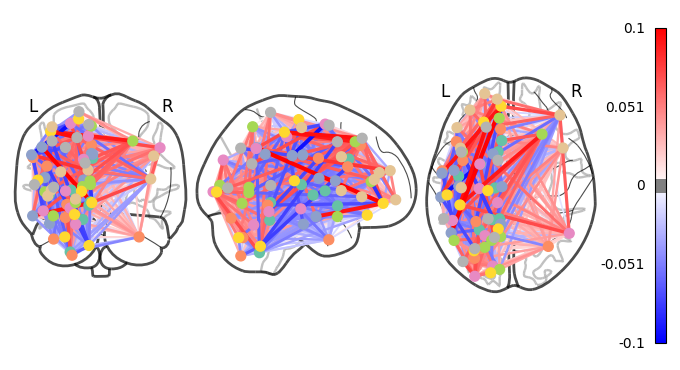

In [37]:
plotting.plot_connectome(feat_exp_matrix, coords, colorbar=True, edge_threshold=0.005)

In [38]:
plotting.view_connectome(feat_exp_matrix, coords, edge_threshold='90%')

# Comparing various ML models (F1)

## K fold
The purpose of k fold is to provide a more robust and reliable evaluation of a machine learning model's performance by splitting the data into multiple folds, training the model on different combinations of these folds, and testing on the remaining fold, thereby minimizing overfitting and providing a more accurate estimate of generalization ability

In [39]:
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
pa = PassiveAggressiveClassifier()
decision = DecisionTreeClassifier()
knn = KNeighborsClassifier()
rf = RandomForestClassifier()


In [40]:
X=X_features
y = gender['YN']
kf = StratifiedKFold(n_splits=4, random_state=None, shuffle=False)
score_mean=[]
for i in [pa,decision,knn,rf,logreg,l_svc]: 
    scores = cross_val_score(i, X, y, cv=kf, scoring='f1')
    score_mean.append(round(scores.mean(),2)  )

In [ ]:
d = {
	'Algorithm': ['PA', 'Decision Tree', 'KNN', 'RF', 'MLP', 'SVM'],
	'F1 Score': score_mean
}
score = pd.DataFrame(data=d)
score

,Algorithm,F1 Score
0,PA,0.75
1,Decision Tree,0.17
2,KNN,0.25
3,RF,0.67
4,MLP,0.75
5,SVM,0.75


# Conclusion 

Our analysis demonstrates the potential of resting-state fMRI data in predicting gender using machine learning techniques. The findings suggest that features from the left hemisphere of the brain may play a critical role in distinguishing between male and female participants.

Among the models tested, the Passive Aggressive Classifier, Support Vector Machine (SVM), and Multi-Layer Perceptron (MLP) achieved the highest F1 scores, indicating strong performance in gender classification.